In [1]:
import matplotlib.pyplot as plt
import numpy as np
import os, scipy
import matplotlib.colors as mcolors
import networkx as nx
import pickle

if os.getcwd().split(os.sep)[-1] == "examples":
    os.chdir('..')
    os.chdir('..')
    os.chdir('..')
    os.chdir('..')

# We import the model, stimuli, and the optimal control package
from neurolib.models.wc import WCModel
from neurolib.utils.stimulus import ZeroInput
from neurolib.optimal_control import oc_wc, cost_functions
from neurolib.optimal_control.oc_utils.plot_oc import plot_oc_nw

# This will reload all imports as soon as the code changes
%load_ext autoreload
%autoreload 2


options = {
    'node_color': 'lightgray',
    'node_size': 1000,
    'width': 2,
    'arrowstyle': '-|>',
    'arrowsize': 20,
    'font_size' : 20,
    'font_weight' : 'bold',
    }

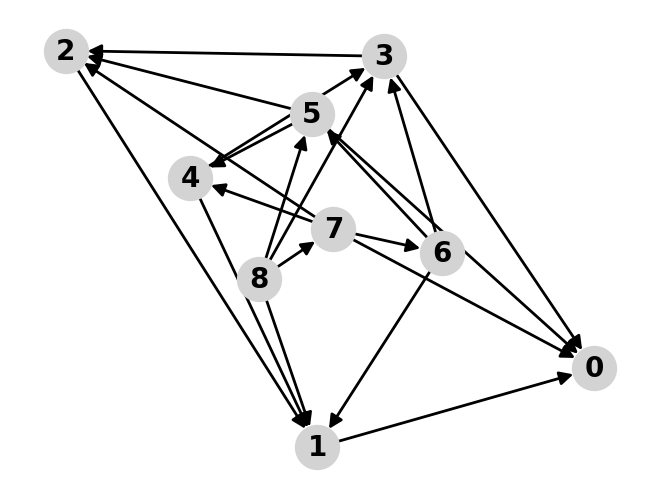

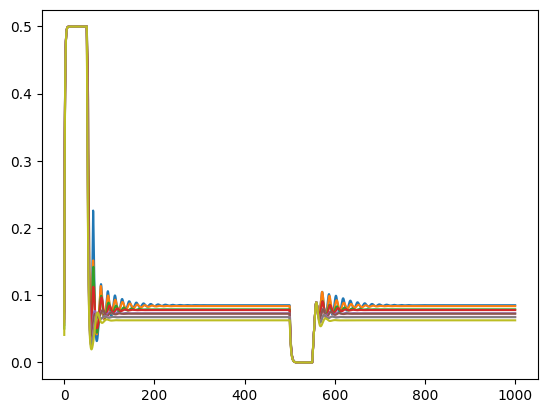

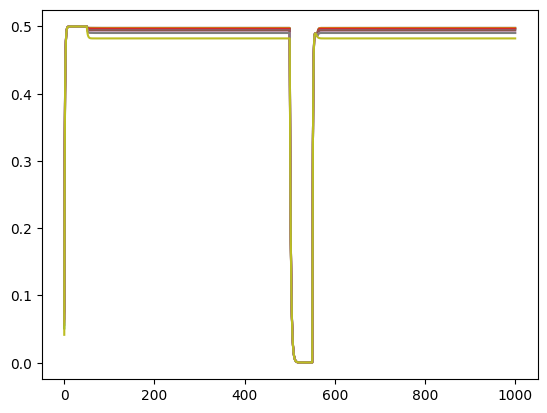

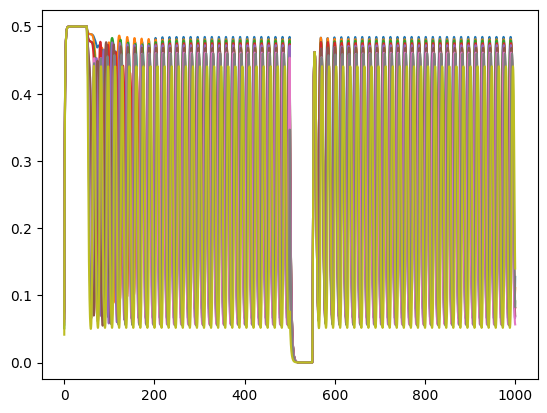

period =  15.647368421052633


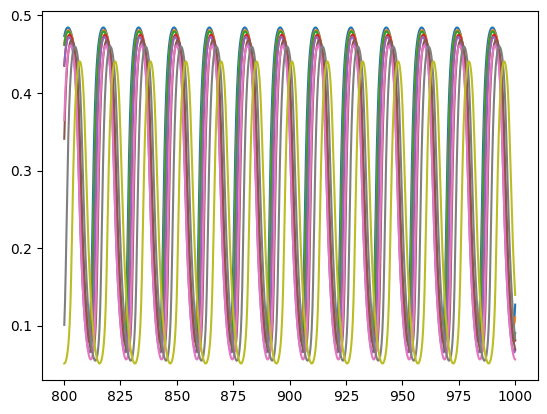

In [2]:
comp_points = [[1., 0.5], [3., 0.5], [2., 0.5]]

cmat = np.array(  [[0, 1, 0, 1, 0, 1, 0, 1, 0],
        [0, 0, 1, 0, 1, 0, 1, 0, 1],
        [0, 0, 0, 1, 0, 1, 0, 1, 0],
        [0, 0, 0, 0, 1, 0, 1, 0, 1],
        [0, 0, 0, 0, 0, 1, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 0]]
)
dmat = 10. * cmat.copy()
N = cmat.shape[0]
dir = "images_9n"


G = nx.DiGraph() 
for n in range(cmat.shape[0]):
        for l in range(cmat.shape[1]):
            if cmat[n,l] != 0:
                G.add_edge(l,n)
nx.draw(G, with_labels=True, arrows=True, **options)
plt.savefig(os.path.join(dir, "network.png"), bbox_inches='tight')
plt.show()

colors = []
n = 0
for col in mcolors.TABLEAU_COLORS:
    colors.append(col)
    n += 1
    if n >= N: break

model = WCModel(Cmat=cmat, Dmat=dmat)

dt = 0.1
model.params['dt'] = dt # Integration time step, ms
model.params['duration'] = 1. * 1000 # Simulation time, ms
model.params.signalV = 1.

zero_input = ZeroInput().generate_input(duration=model.params['duration']+model.params.dt, dt=model.params.dt)
rect_input = np.vstack( (zero_input)*2 )
rect_input[0,:500] = 5.
rect_input[0,5000:5500] = -5.

for p in comp_points:
    model.params["exc_ext"] = p[0] + rect_input[0,:]
    model.params["inh_ext"] = p[1]
    model.run()

    for n in range(N):
        plt.plot(model.t, model.exc[n,:], color=colors[n])
    plt.show()

    if p[0] == 2.:

        peaks = scipy.signal.find_peaks(model.exc[0,2000:5000])[0]
        plist = []
        for pind in range(1, len(peaks)):
            plist.append(model.params.dt * (peaks[pind]-peaks[pind-1]))

        period = np.mean(plist)
        print("period = ", period)

        peaksn = [None]*N

        for n in range(N):
            peaksn[n] = scipy.signal.find_peaks(model.exc[n,4000:5000])[0]

        for n in range(N):
            plt.plot(model.t[8000:10000], model.exc[n,8000:10000], color=colors[n])
        plt.show()

In [3]:
def getperiods(x, prominence):
    timing_list = [None] * N
    periods_list = [None] * N

    for n in range(N):
        timing_list[n] = scipy.signal.find_peaks(x[n, 0, 300:], prominence=prominence)[0]
        periods_list[n] = []
        if len(timing_list[n]) < 3:
            continue
        for pind in range(1, len(timing_list[n])):
            periods_list[n].append(model.params.dt * (timing_list[n][pind]-timing_list[n][pind-1]))

    return timing_list, periods_list

In [4]:
controlmat = np.zeros((N,2))
controlmat[:,0] = 1.

costmat = np.zeros((N, 2))
costmat[:,0] = 1.

duration = 200.
model.params.duration = duration
zero_input0 = ZeroInput().generate_input(duration=duration+model.params.dt, dt=model.params.dt)
zero_input = np.vstack( ([zero_input0]*2) )[np.newaxis,:,:]
zero_control = np.vstack( ([zero_input]*N))

print(zero_input0.shape, zero_input.shape, zero_control.shape)

w2_array = [1e-3, 1e-5]

results = dict()
results["controls"] = [ [ [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ] ], 
                        [ [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ] ], 
                        [ [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ] ], 
]

target_array = [0.5*period, 0.9*period, period, 1.1*period, 1.6*period]
results["periods"] = [ [ [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ] ], 
                        [ [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ] ], 
                        [ [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ] ], 
]
results["timings"] = [ [ [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ] ], 
                        [ [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ] ], 
                        [ [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ], [ [None, None], [None, None], [None, None], [None, None] ] ], 
]

(1, 2001) (1, 2, 2001) (9, 2, 2001)


In [11]:
it = 100
pr = np.arange(0,101,10)
maxstr = 10.
nmaxdel = model.getMaxDelay()
proms = [0.01, 0.001]

init_control = zero_control.copy()

pind =  0
itar =  0
imet =  0
iw =  0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.07715639105973271
Cost in iteration 10: -0.5217598348169143
Cost in iteration 20: -0.5576350500830509
Cost in iteration 30: -0.5605486797196816
Cost in iteration 40: -0.5640321682335081
Cost in iteration 50: -0.5649847130447339
Cost in iteration 60: -0.5658485549264702
Converged in iteration 61 with cost -0.5658485549264702
Final cost : -0.5658485549264702


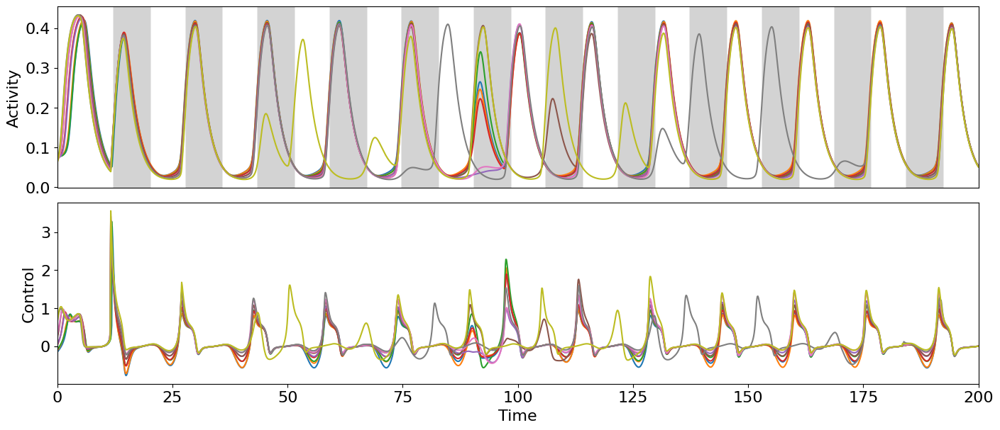

iw =  1
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.5156519141097464
Cost in iteration 10: -1.092457128573578
Cost in iteration 20: -1.5627809100552288
Converged in iteration 22 with cost -1.5630309128051645
Final cost : -1.5630309128051645


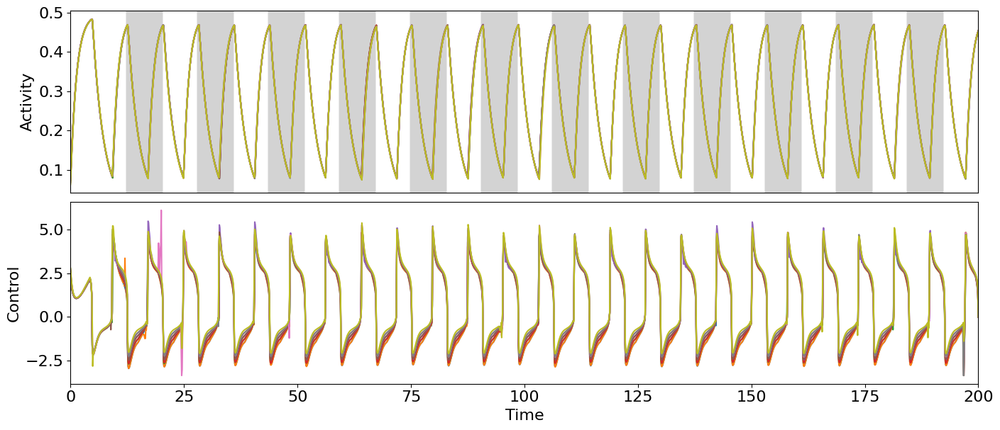

itar =  1
imet =  0
iw =  0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.9782889672435081
Cost in iteration 10: -1.7044647991024389
Cost in iteration 20: -1.7093130038072966
Cost in iteration 30: -1.7099344380690655
Cost in iteration 40: -1.7102197446134535
Converged in iteration 48 with cost -1.7103170897715851
Final cost : -1.7103170897715851


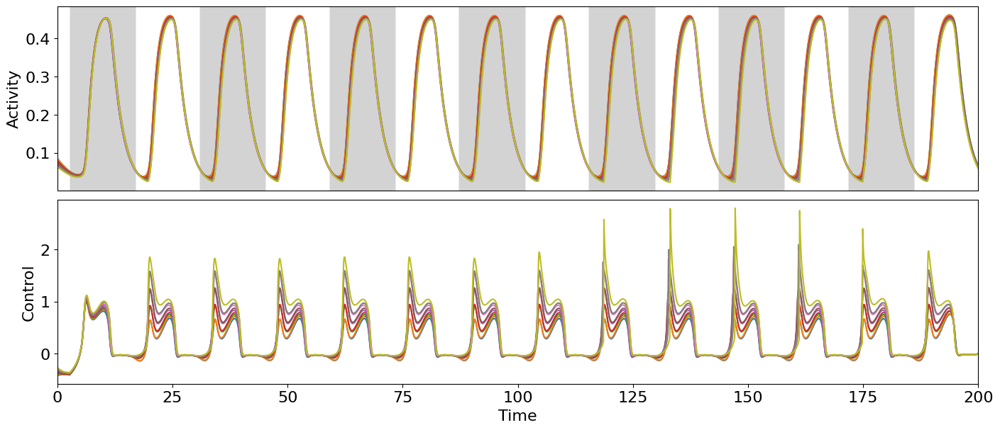

iw =  1
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -1.3856996429060584
Cost in iteration 10: -2.0304828132547854
Cost in iteration 20: -2.1717374710387514
Cost in iteration 30: -2.1718064722685737
Cost in iteration 40: -2.171821972740354
Cost in iteration 50: -2.1718402814383166
Cost in iteration 60: -2.1718576628952904
Cost in iteration 70: -2.171870338338772
Cost in iteration 80: -2.1718788970811898
Cost in iteration 90: -2.1718883588723776
Cost in iteration 100: -2.171899515285485
Final cost : -2.171899515285485


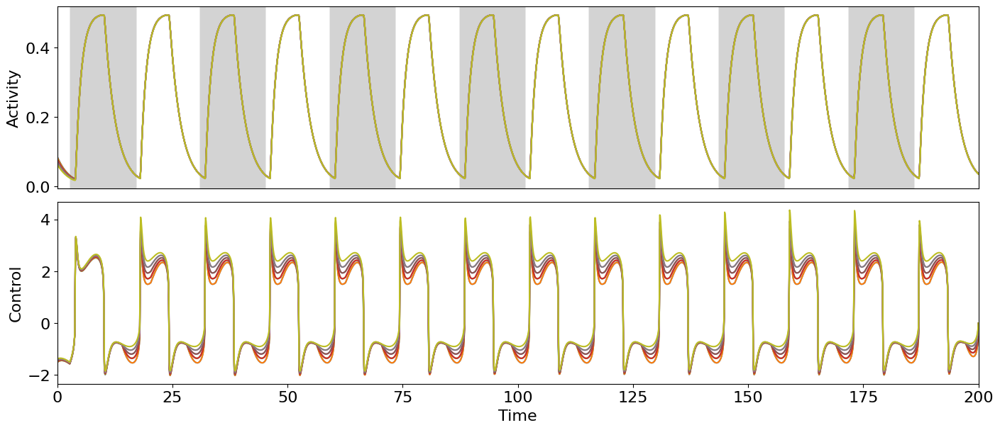

itar =  2
imet =  0
iw =  0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.9817365896326589
Cost in iteration 10: -1.7603632154694084
Cost in iteration 20: -1.766152891623027
Converged in iteration 26 with cost -1.7667443044958986
Final cost : -1.7667443044958986


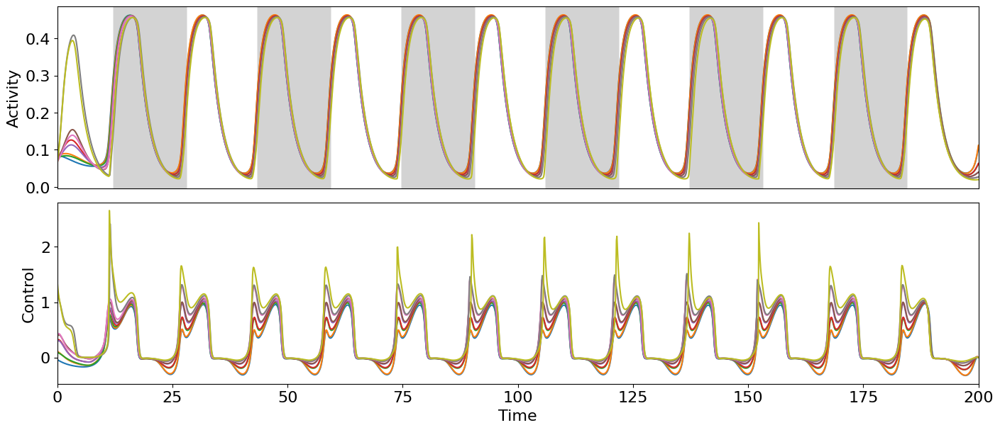

iw =  1
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -1.4306590963015908
Cost in iteration 10: -2.1202306964642523
Cost in iteration 20: -2.264755874686088
Cost in iteration 30: -2.27107083154096
Cost in iteration 40: -2.275171799604039
Cost in iteration 50: -2.278262504713481
Cost in iteration 60: -2.2806392465233536
Cost in iteration 70: -2.282066621953047
Cost in iteration 80: -2.2831507582246604
Cost in iteration 90: -2.2843757764637935
Cost in iteration 100: -2.285118583226064
Final cost : -2.285118583226064


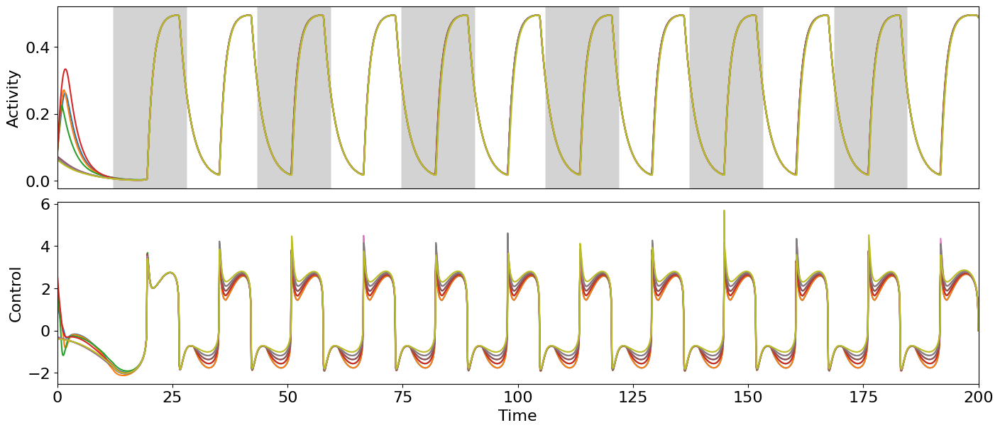

itar =  3
imet =  0
iw =  0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.9447657628140089
Cost in iteration 10: -1.756883638217462
Cost in iteration 20: -1.7674188522356051
Converged in iteration 23 with cost -1.7674359513054083
Final cost : -1.7674359513054083


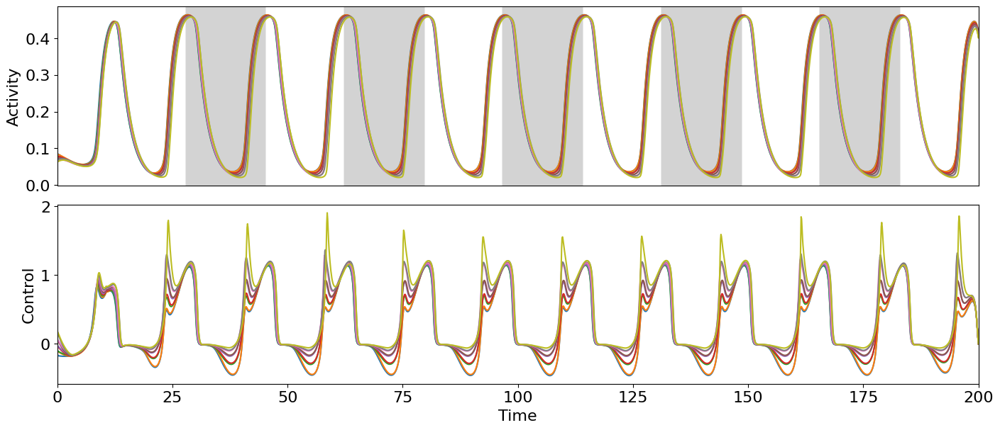

iw =  1
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -1.4822700883292401
Cost in iteration 10: -2.1854352369225354
Cost in iteration 20: -2.332144515607508
Cost in iteration 30: -2.332481389913527
Cost in iteration 40: -2.3326085170589326
Cost in iteration 50: -2.3327040467119424
Cost in iteration 60: -2.3327944982347906
Cost in iteration 70: -2.3328802110418674
Cost in iteration 80: -2.332949175584454
Cost in iteration 90: -2.333000865479415
Cost in iteration 100: -2.3330373329977125
Final cost : -2.3330373329977125


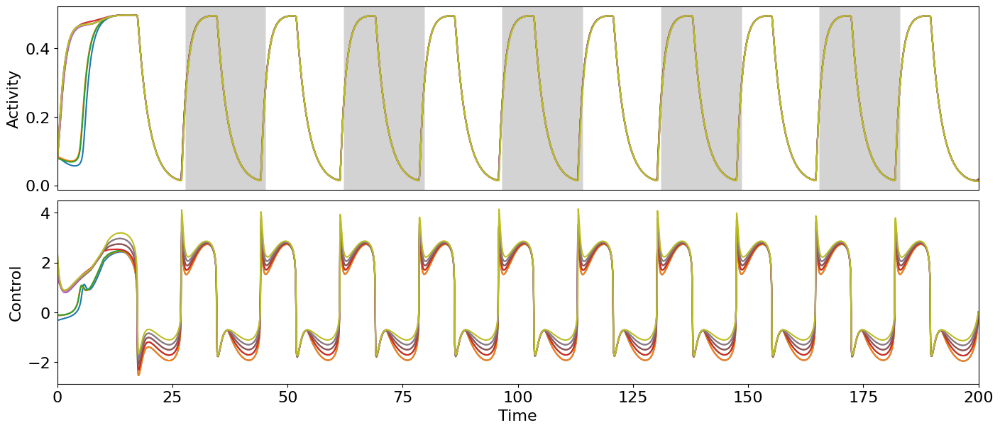

itar =  4
imet =  0
iw =  0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -1.6536339928870105
Cost in iteration 10: -1.7423837328776486
Cost in iteration 20: -1.7566356596358297
Cost in iteration 30: -1.758452017539967
Cost in iteration 40: -1.7588030517641973
Converged in iteration 48 with cost -1.7588626426091962
Final cost : -1.7588626426091962


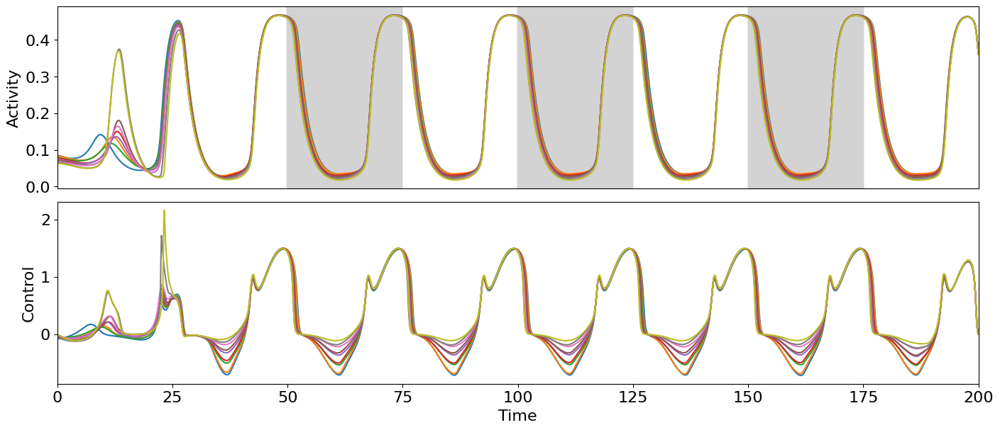

iw =  1
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -2.5319943805620193
Cost in iteration 10: -2.5320178529259665
Converged in iteration 14 with cost -2.5320220643370437
Final cost : -2.5320220643370437


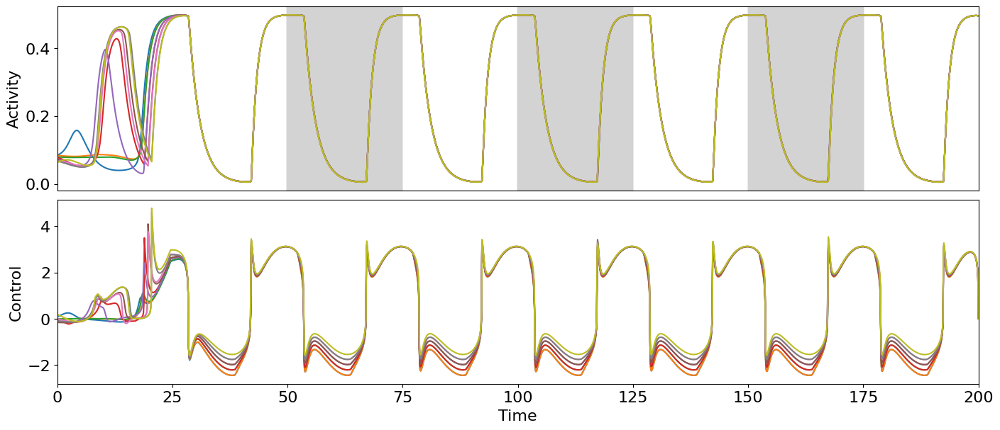

pind =  1
itar =  0
imet =  0
iw =  0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 0.001562764799199541
Cost in iteration 10: -0.019971515910023524
Cost in iteration 20: -0.02700328668162
Cost in iteration 30: -0.028479354686686623
Cost in iteration 40: -0.032196210756658766
Cost in iteration 50: -0.03220899333659597
Cost in iteration 60: -0.03221967499362779
Cost in iteration 70: -0.03223219206257356
Cost in iteration 80: -0.032243428299451336
Cost in iteration 90: -0.03225404657197728
Cost in iteration 100: -0.032263877428065094
Final cost : -0.032263877428065094


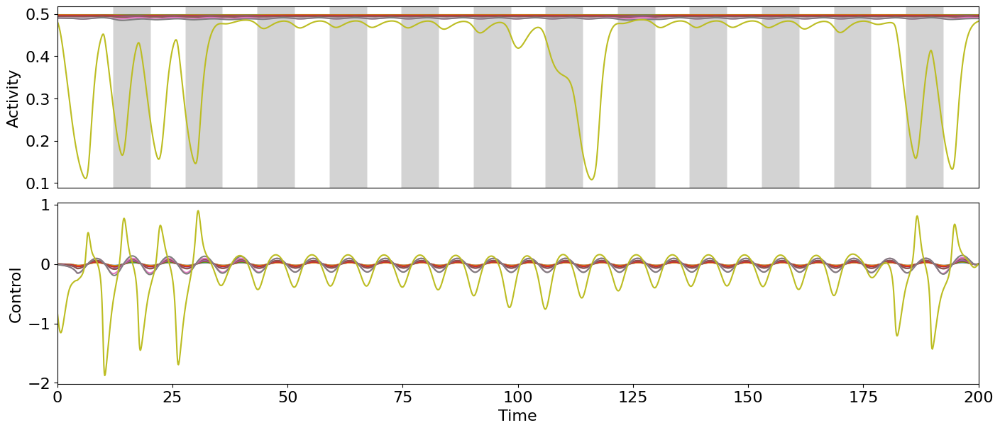

iw =  1
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.5322154540480029
Cost in iteration 10: -1.225030590970991
Cost in iteration 20: -1.5580825370245195
Cost in iteration 30: -1.5594096655814935
Cost in iteration 40: -1.55991005980813
Cost in iteration 50: -1.5603611885957245
Cost in iteration 60: -1.560716831778073
Cost in iteration 70: -1.5610907684167779
Cost in iteration 80: -1.5614387985151952
Cost in iteration 90: -1.561709225206345
Cost in iteration 100: -1.5619785862916125
Final cost : -1.5619785862916125


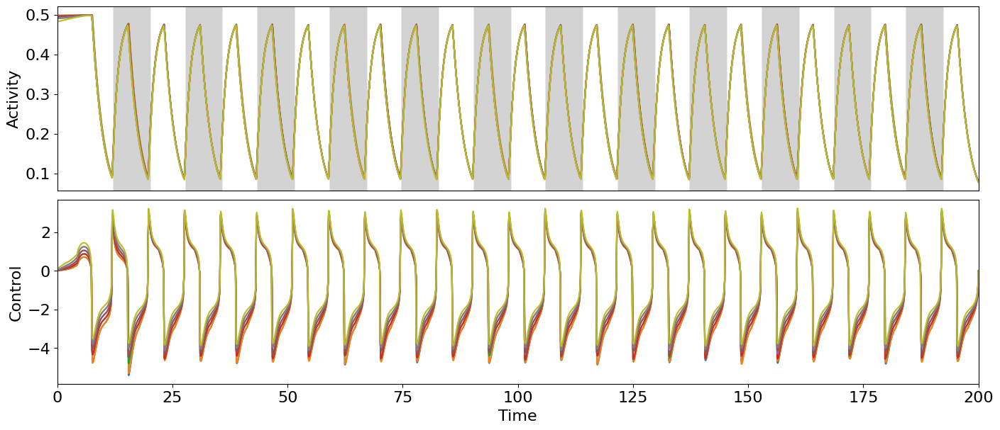

itar =  1
imet =  0
iw =  0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.17220770271814173
Cost in iteration 10: -0.4046348550000055
Cost in iteration 20: -0.496824808944001
Converged in iteration 28 with cost -0.5387433464594776
Final cost : -0.5387433464594776


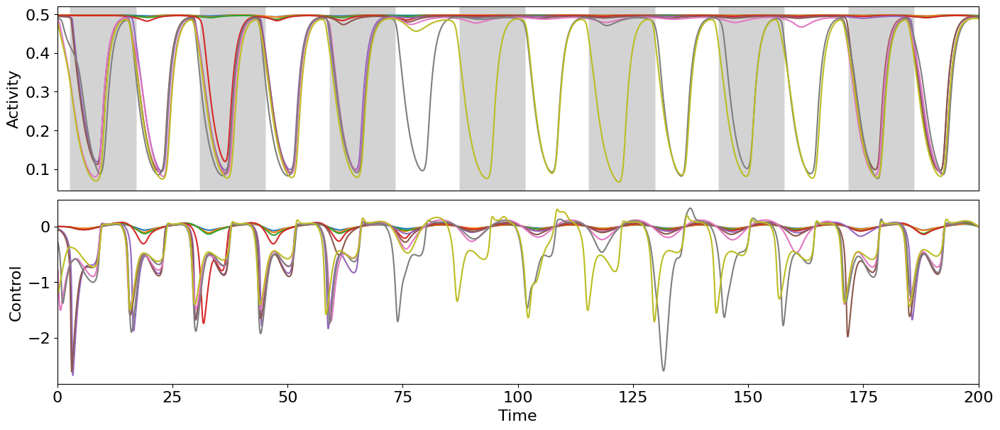

iw =  1
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -1.3429172320116238
Cost in iteration 10: -1.9986755324843095
Converged in iteration 20 with cost -2.149892622935029
Final cost : -2.149892622935029


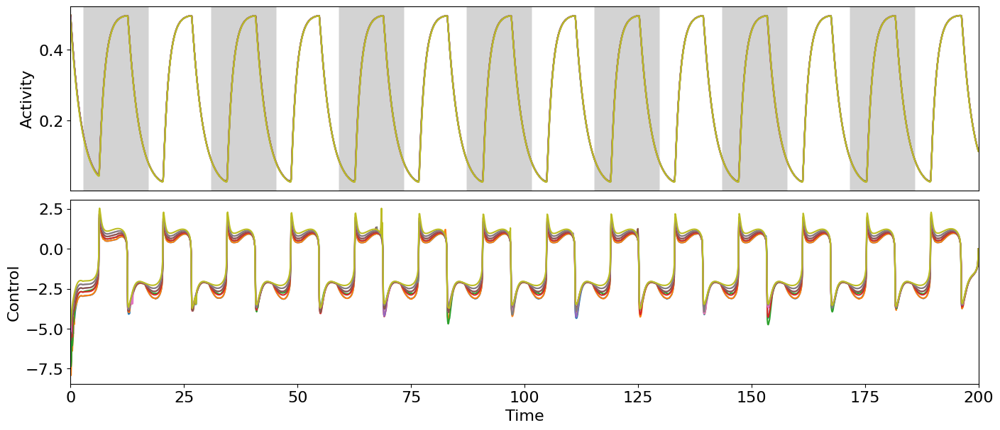

itar =  2
imet =  0
iw =  0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.07070510770332825
Converged in iteration 10 with cost -0.31699612409804545
Final cost : -0.31699612409804545


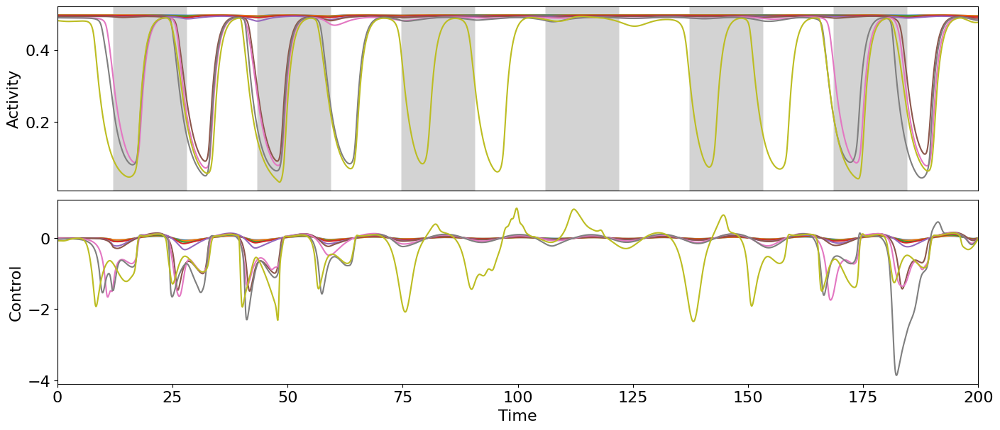

iw =  1
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -1.4055502032978362
Cost in iteration 10: -2.086724997235871
Cost in iteration 20: -2.2495360009241354
Converged in iteration 22 with cost -2.249576496274895
Final cost : -2.249576496274895


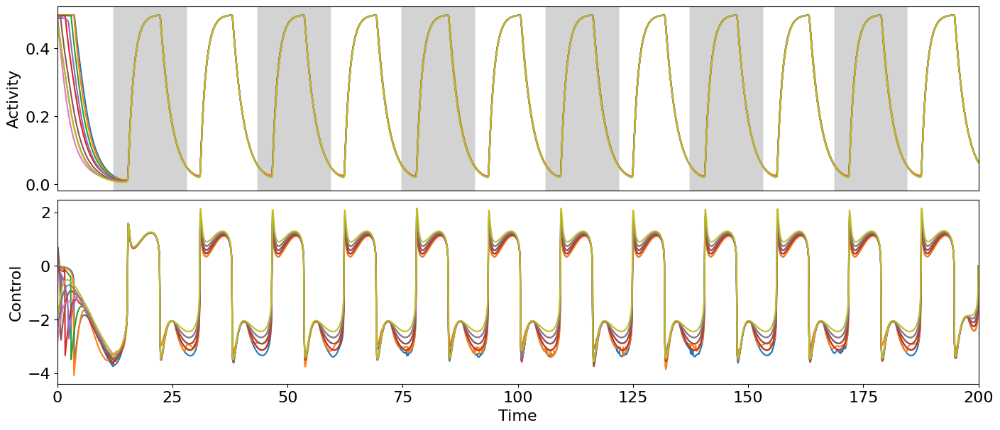

itar =  3
imet =  0
iw =  0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 0.022176006857014458
Cost in iteration 10: -0.2848182191711145
Cost in iteration 20: -0.3473166047354357
Converged in iteration 24 with cost -0.3487907371108583
Final cost : -0.3487907371108583


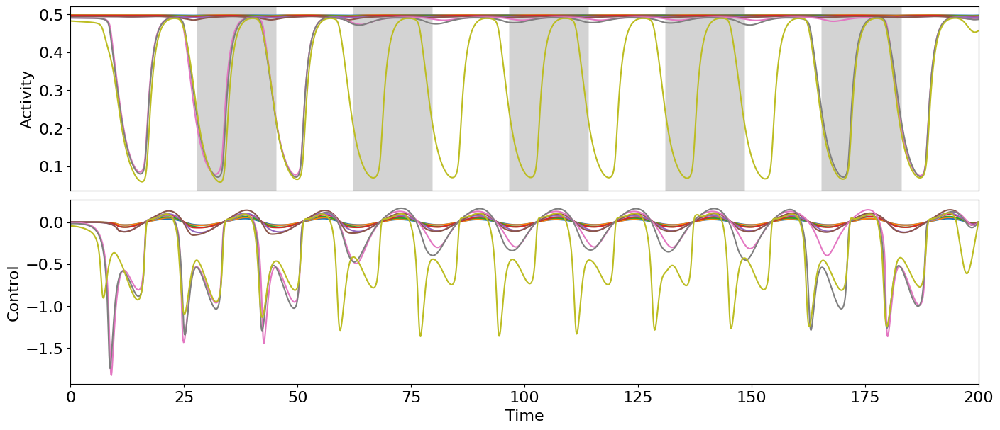

iw =  1
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -1.4509018341956754
Cost in iteration 10: -2.1263698616397906
Cost in iteration 20: -2.3122957863389026
Cost in iteration 30: -2.3128053246375546
Cost in iteration 40: -2.31287916581185
Cost in iteration 50: -2.3129633023340346
Cost in iteration 60: -2.3130212894116586
Cost in iteration 70: -2.313090318319486
Cost in iteration 80: -2.313154034790719
Cost in iteration 90: -2.3132035923833385
Cost in iteration 100: -2.313258011117542
Final cost : -2.313258011117542


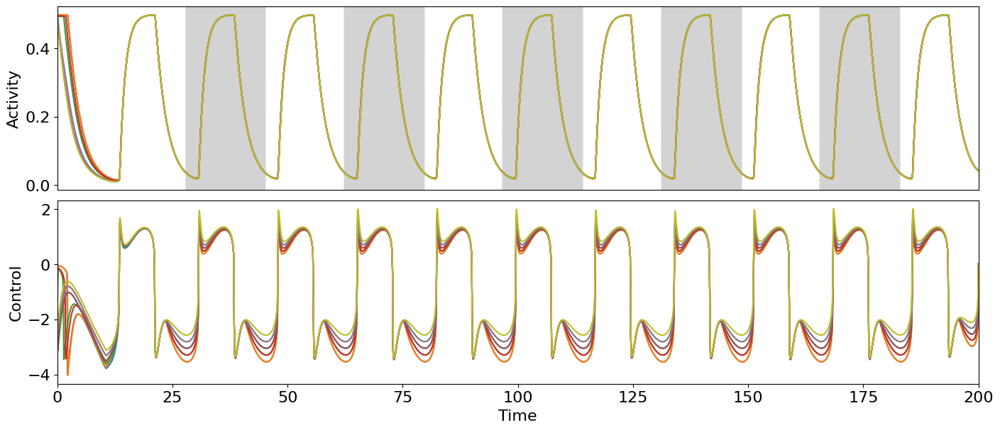

itar =  4
imet =  0
iw =  0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.17335965290192745
Cost in iteration 10: -0.20750198223627658
Cost in iteration 20: -0.4300149666464
Converged in iteration 21 with cost -0.4300149666464
Final cost : -0.4300149666464


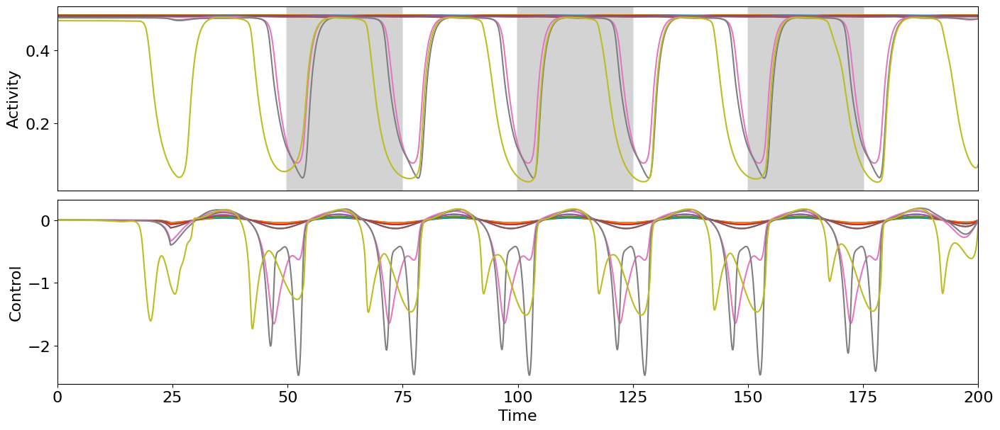

iw =  1
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -2.52081194818838
Cost in iteration 10: -2.5217282167503487
Cost in iteration 20: -2.522996790055321
Cost in iteration 30: -2.5232387200359554
Converged in iteration 40 with cost -2.5233429871900634
Final cost : -2.5233429871900634


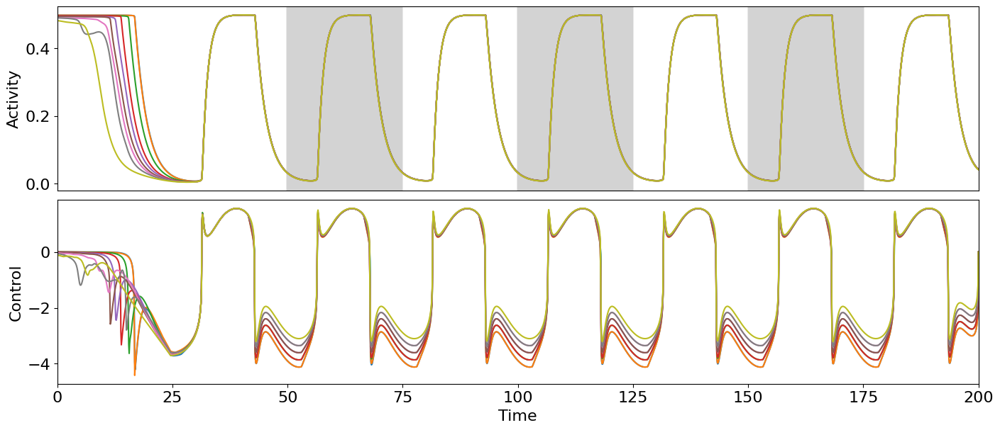

pind =  2
itar =  0
imet =  0
iw =  0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.10852410562100408
Converged in iteration 3 with cost -0.18969301447813844
Final cost : -0.18969301447813844


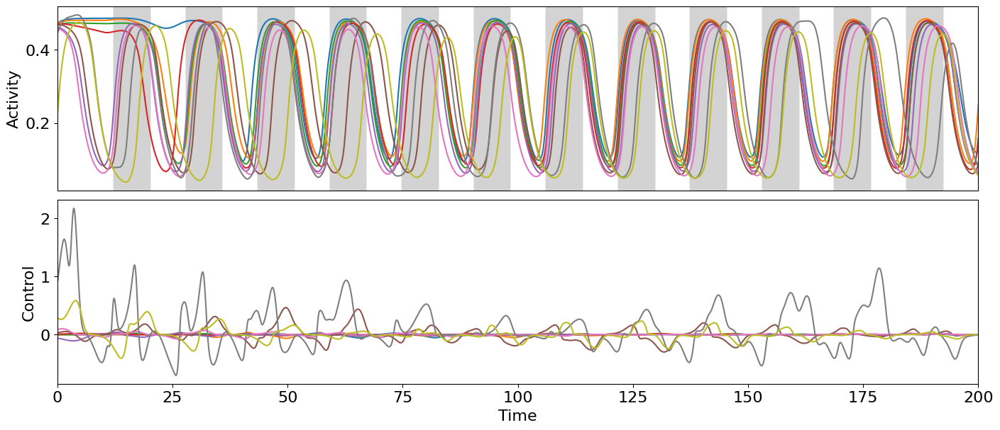

iw =  1
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.06348377903582454
Converged in iteration 4 with cost -0.15428786349930793
Final cost : -0.15428786349930793


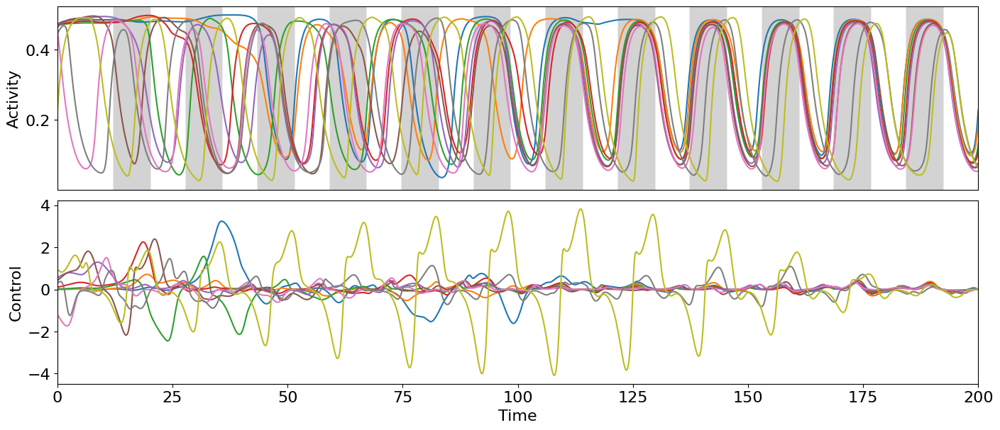

itar =  1
imet =  0
iw =  0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.32617832049841655
Cost in iteration 10: -1.8825355172331406
Converged in iteration 16 with cost -1.9179159720540981
Final cost : -1.9179159720540981


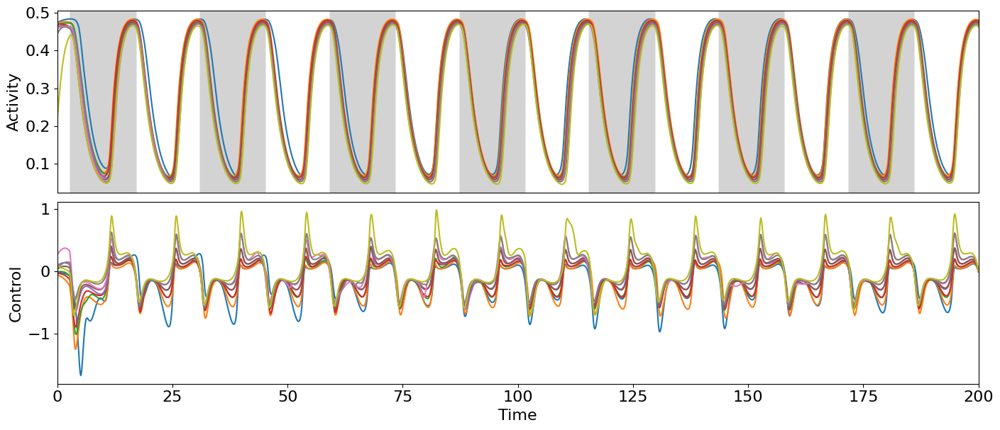

iw =  1
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.46117724967875073
Cost in iteration 10: -2.0277618329350218
Converged in iteration 18 with cost -2.167572263941189
Final cost : -2.167572263941189


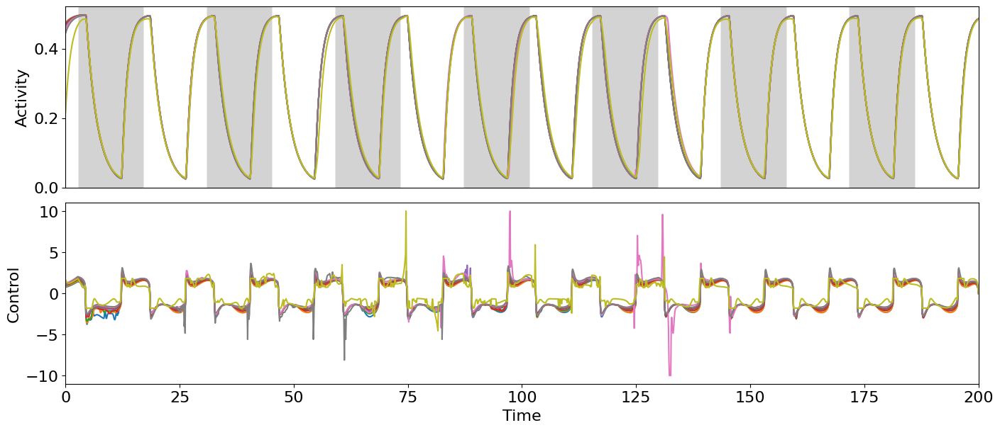

itar =  2
imet =  0
iw =  0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -1.1145727129843948
Cost in iteration 10: -1.9663229420078798
Converged in iteration 11 with cost -1.9663229420078798
Final cost : -1.9663229420078798


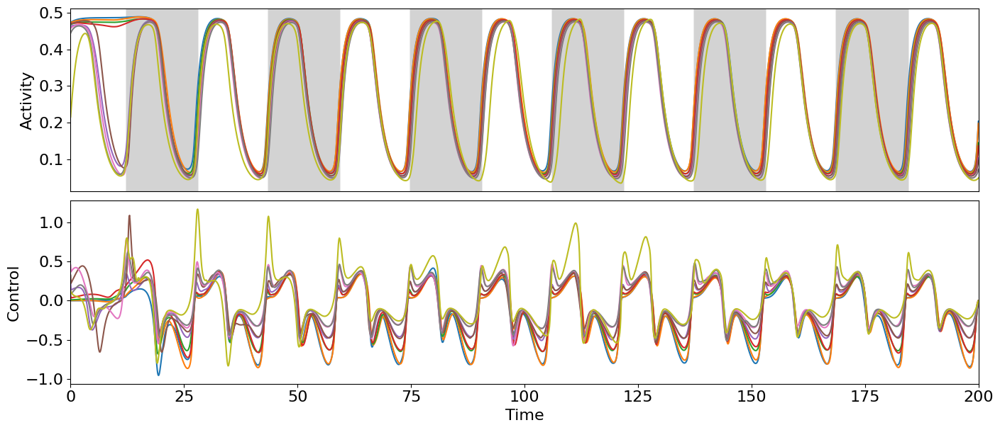

iw =  1
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -1.2148933822344103
Cost in iteration 10: -2.083497187568093
Cost in iteration 20: -2.2545725113180115
Converged in iteration 23 with cost -2.255559460010259
Final cost : -2.255559460010259


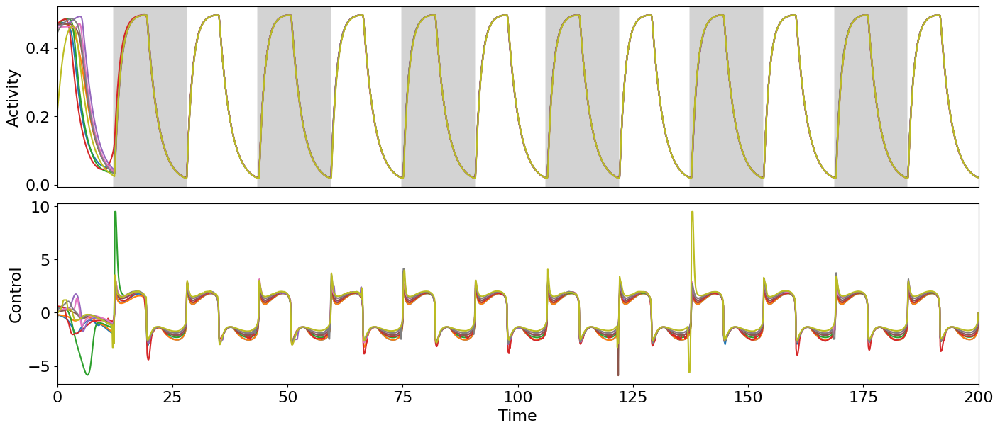

itar =  3
imet =  0
iw =  0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.4054720659922467
Cost in iteration 10: -1.9443068548339686
Cost in iteration 20: -1.9844117178984055
Cost in iteration 30: -1.9860676776905488
Cost in iteration 40: -1.9866190614767334
Converged in iteration 44 with cost -1.9866793732819878
Final cost : -1.9866793732819878


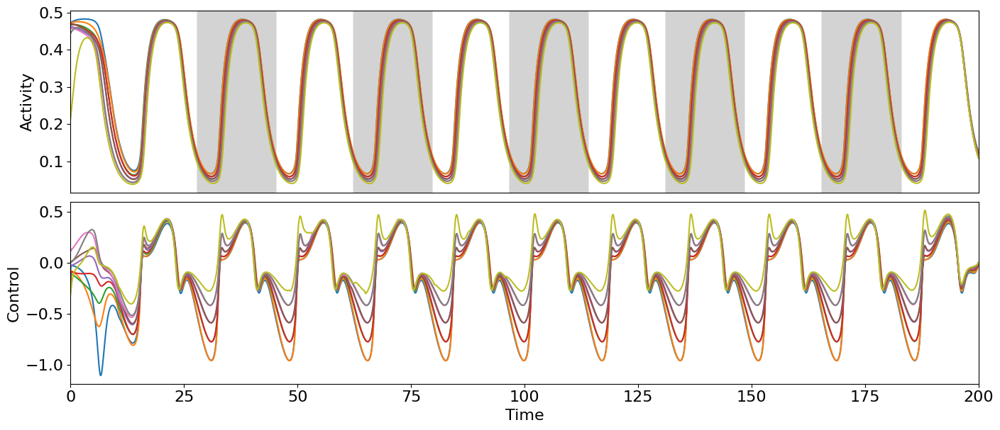

iw =  1
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -1.483485521450838
Cost in iteration 10: -2.211062421586754
Cost in iteration 20: -2.3492273328088924
Cost in iteration 30: -2.352317152589466
Converged in iteration 34 with cost -2.3525560652441406
Final cost : -2.3525560652441406


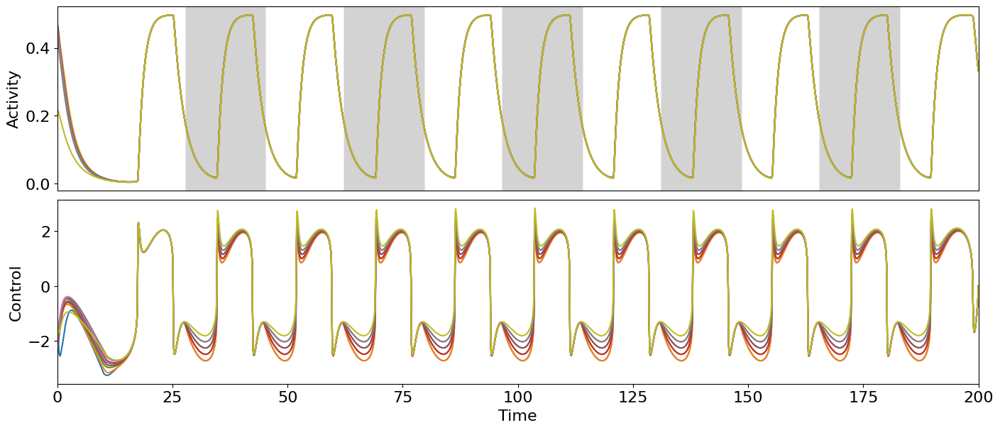

itar =  4
imet =  0
iw =  0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.4171766442665602
Converged in iteration 4 with cost -0.43873991554019165
Final cost : -0.43873991554019165


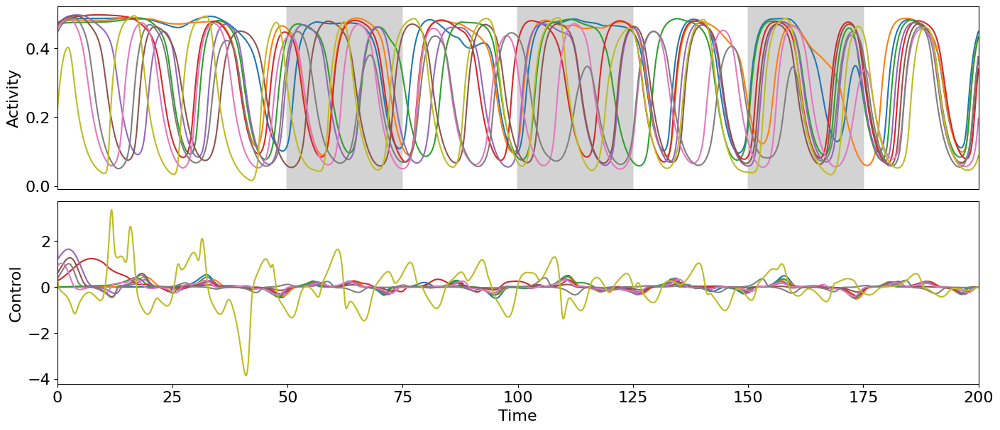

iw =  1
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -2.5313725173360617
Cost in iteration 10: -2.5318765049015615
Converged in iteration 13 with cost -2.5319855146144277
Final cost : -2.5319855146144277


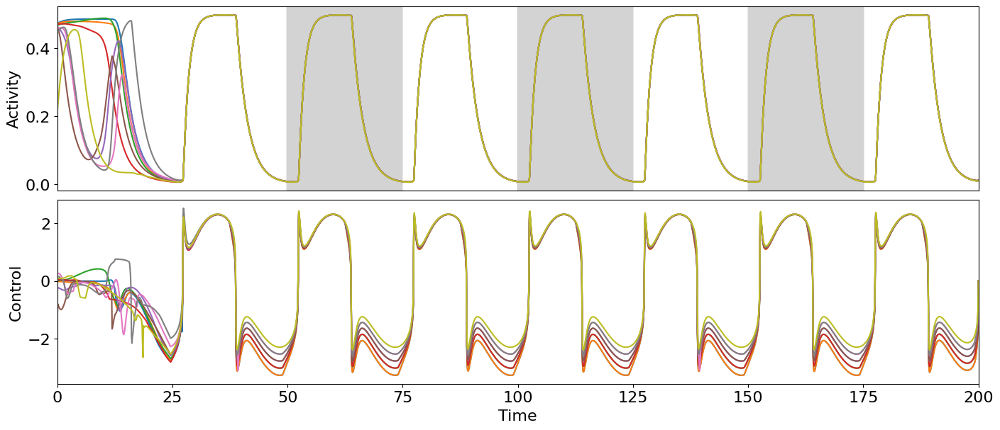

In [12]:
for pind in range(len(comp_points)):

    print("pind = ", pind)

    p = comp_points[pind]
    
    testd = 1000.
    model.params.duration = testd
    test_input = ZeroInput().generate_input(duration=testd+model.params.dt, dt=model.params.dt)
    model.params["exc_ext"] = test_input + p[0]
    model.params["inh_ext"] = test_input + p[1]
    model.run()

    einit = np.zeros((N, nmaxdel+1))
    iinit = np.zeros((N, nmaxdel+1))


    for n in range(N):
        einit[n,:] = model.exc[n,-1]
        iinit[n,:] = model.inh[n,-1]

    model.params.duration = duration

    model.params["exc_ext"] = zero_control[:,0,:] + p[0]
    model.params["inh_ext"] = zero_control[:,0,:] + p[1]

    model.params["exc_init"] = einit
    model.params["inh_init"] = iinit

    model.run()

    for itar in range(len(target_array)):

        print("itar = ", itar)
        
        target_period = target_array[itar]
        i00 = 0
        int0 = np.around( (duration - i00 * target_period) / model.params.dt, 0).astype(int)     
        while int0 > 12*target_period:
            i00 += 1
            int0 = np.around( (duration - i00 * target_period) / model.params.dt, 0).astype(int)

        for imet in range(4):

            if imet != 0:
                continue

            print("imet = ", imet)

            for iw in range(len(w2_array)):

                print("iw = ", iw)
                
                w2 = w2_array[iw]

                model_controlled = oc_wc.OcWc(model, target_period, print_array=pr, cost_interval=(int0,None), cost_matrix=costmat, control_matrix = controlmat)
                model_controlled.maximum_control_strength = maxstr
                model_controlled.weights["w_p"] = 0.
                model_controlled.weights["w_2"] = w2

                if imet in [2]:
                    init_control = zero_control.copy()
                    tarray = np.arange(int0*dt, int0*dt + 2.*target_period, dt)
                    init_control[0,0,int0:int0+len(tarray)] = np.sin(2.*np.pi *tarray/target_period)
                    init_control[0,1,int0:int0+len(tarray)] = np.sin(2.*np.pi *tarray/target_period)

                    model_controlled.control = init_control.copy()
                    model_controlled.update_input()

                if imet == 0:
                    model_controlled.weights["w_f_sync"] = 1.
                elif imet == 1:
                    model_controlled.weights["w_cc"] = 1.
                elif imet == 2:
                    model_controlled.weights["w_ko"] = 1.
                elif imet == 3:
                    model_controlled.weights["w_var"] = 1.

                if type(results["controls"][pind][itar][imet][iw]) != type(None):
                    model_controlled.control = results["controls"][pind][itar][imet][iw].copy()
                    model_controlled.update_input()

                model_controlled.optimize(it)
                results["controls"][pind][itar][imet][iw] = model_controlled.control.copy()

                timings, periods = getperiods(model_controlled.get_xs(), proms[iw])
                results["timings"][pind][itar][imet][iw] = timings
                results["periods"][pind][itar][imet][iw] = periods

                fname = str(pind) + "_" + str(itar) + "_" + str(imet) + "_" + str(iw) + ".png"

                if imet == 0: plot_oc_nw(N, duration, dt, model_controlled.get_xs(), target_period, model_controlled.control, filename= os.path.join(dir, fname))
                else: plot_oc_nw(N, duration, dt, model_controlled.get_xs(), 200, model_controlled.control, filename= os.path.join(dir, fname))

In [13]:
with open('snych_9n.pickle', 'wb') as f:
    pickle.dump(results, f)

In [6]:
with open('snych_9n.pickle', 'rb') as f:
    res_read = pickle.load(f)
    print(res_read.keys() )

results = res_read.copy()

dict_keys(['controls', 'periods', 'timings'])


In [14]:
xl = [ ["Down F", "Up F", "Osc F"], ["Down CC", "Up CC", "Osc CC"], ["Down KO", "Up KO", "Osc KO"], ["Down Var", "Up Var", "Osc Var"]]

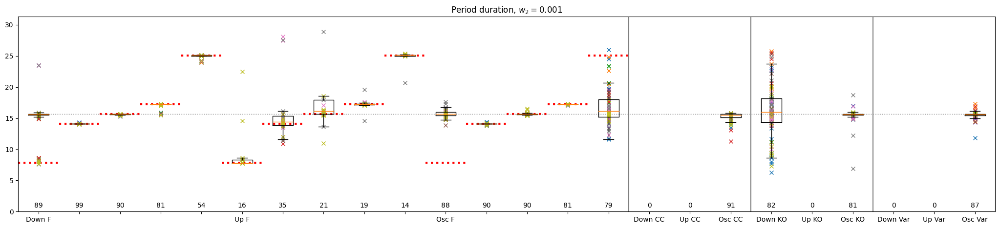

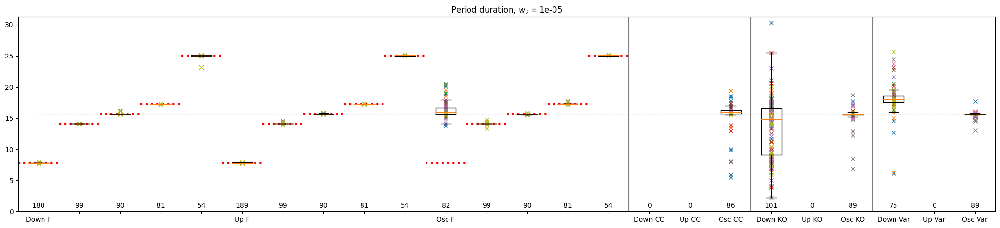

In [15]:
for iw in range(len(w2_array)):
    ydata = []
    xlabels = []
    fig = plt.figure(figsize =(20, 4))
    ax = fig.add_axes([0, 0, 1, 1])

    xpos = 0

    for imet in range(4):

        for pind in range(len(comp_points)):

            for itar in range(len(target_array)):

                if imet not in [0]:
                    if itar not in [2]:
                        continue

                target_period = target_array[itar]
                #xpos = 15*imet + 5*pind + itar 

                if imet in [0]:
                    if itar != 0:
                        xlabels.append("")
                    else:
                        xlabels.append(xl[imet][pind])
                else:
                    xlabels.append(xl[imet][pind])

                data = results["periods"][pind][itar][imet][iw]
                ydata_ = []
                
                if data is None:
                    ydata.append(ydata_)
                    continue

                n_datapoints = 0

                for n in range(N):
                    n_datapoints += len(data[n])
                    
                    if len(data[n]) != 0:
                        for dpoint in data[n]:
                            ax.plot(xpos+1, dpoint, marker="x", color=colors[n])
                            ydata_.append(dpoint)

                ydata.append(ydata_)

                ax.text(xpos+1, 1, str(n_datapoints), horizontalalignment='center', verticalalignment='center')
                if xpos < 15: ax.hlines(target_period, xpos+0.5, xpos+1.5, linestyle=":", color="red", linewidth =3)

                xpos += 1


    ax.boxplot(ydata, showfliers=False)
    ax.plot()
    ax.vlines([15.5, 18.5, 21.5], 0., 2.*period, color="grey")
    ax.hlines(period, 1., len(xlabels), linestyle=":", color="grey",linewidth = 1)
    ax.set_xticklabels(xlabels)
    ax.set_ylim(0., 2.*period)
    ax.set_title(r"Period duration, $w_2 = $" + "{}".format(w2_array[iw]))
    plt.show()
    fig.savefig(os.path.join(dir, "periods_" + str(iw) + ".png"), bbox_inches='tight')

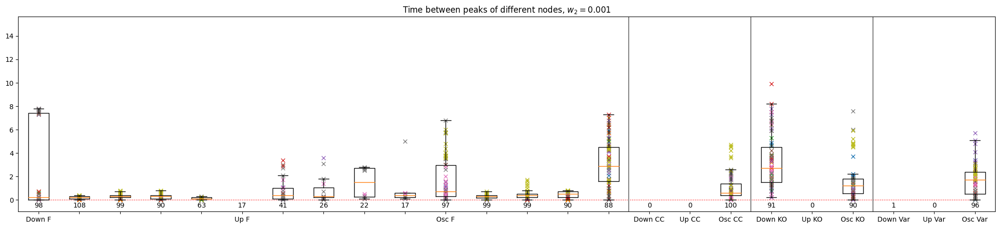

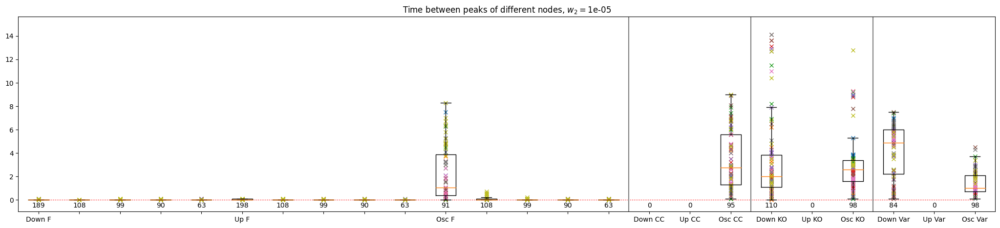

In [16]:
for iw in range(len(w2_array)):
    ydata = []
    xlabels = []
    fig = plt.figure(figsize =(20, 4))
    ax = fig.add_axes([0, 0, 1, 1])
    xpos = 0

    for imet in range(4):

        for pind in range(len(comp_points)):

            for itar in range(len(target_array)):

                if imet not in [0]:
                    if itar not in [2]:
                        continue

                if imet in [0]:
                    if itar != 0:
                        xlabels.append("")
                    else:
                        xlabels.append(xl[imet][pind])
                else:
                    xlabels.append(xl[imet][pind])

                data = results["timings"][pind][itar][imet][iw]
                ydata_ = []

                if data is None:
                    ydata.append(ydata_)
                    continue

                n_maxpeaks = 0

                for n in range(1, N):
                    if len(data[n]) > len(data[n_maxpeaks]):
                        n_maxpeaks = n

                n_datapoints = 0

                for n in range(N):
                    n_datapoints += len(data[n])
                    if n == n_maxpeaks:
                        continue
                    for p in data[n]:
                        dpoint = np.amin(np.abs(p - data[n_maxpeaks])) * dt
                        ydata_.append( dpoint )
                        ax.plot(xpos+1, dpoint, marker="x", color=colors[n])
                ax.text(xpos+1, -0.5, str(n_datapoints), horizontalalignment='center', verticalalignment='center')

                ydata.append(ydata_)

                xpos += 1

    ax.boxplot(ydata, showfliers=False)
    ax.plot()
    ax.hlines(0., 1., len(xlabels), linestyle=":", color="red",linewidth = 1)
    ax.vlines([15.5, 18.5, 21.5], -1.,period, color="grey")
    ax.set_xticklabels(xlabels)
    ax.set_ylim(-1., period)
    ax.set_title(r"Time between peaks of different nodes, $w_2 = $" + "{}".format(w2_array[iw]))
    plt.show()
    fig.savefig(os.path.join(dir, "timings_" + str(iw) + ".png"), bbox_inches='tight')